# Template Matching

Template match methods: https://docs.opencv.org/3.4.1/df/dfb/group__imgproc__object.html#ga3a7850640f1fe1f58fe91a2d7583695d


Use `gimp` to make a template image of a character of your choice

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import cv2 as cv
print ('opencv version = ', cv.__version__)

opencv version =  3.3.1


(44, 52, 3) 52 44


(<Figure size 72x72 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x2d0b3342e48>)

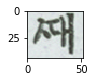

In [2]:
imagefilename = 'onechar.png'
template = cv.imread (imagefilename)
h,w,ch = template.shape
#w = template.shape[0]
#h = template.shape[1]
print(template.shape, w, h)
plt.figure(figsize=(1,1)), plt.imshow (template)

(1660, 944)


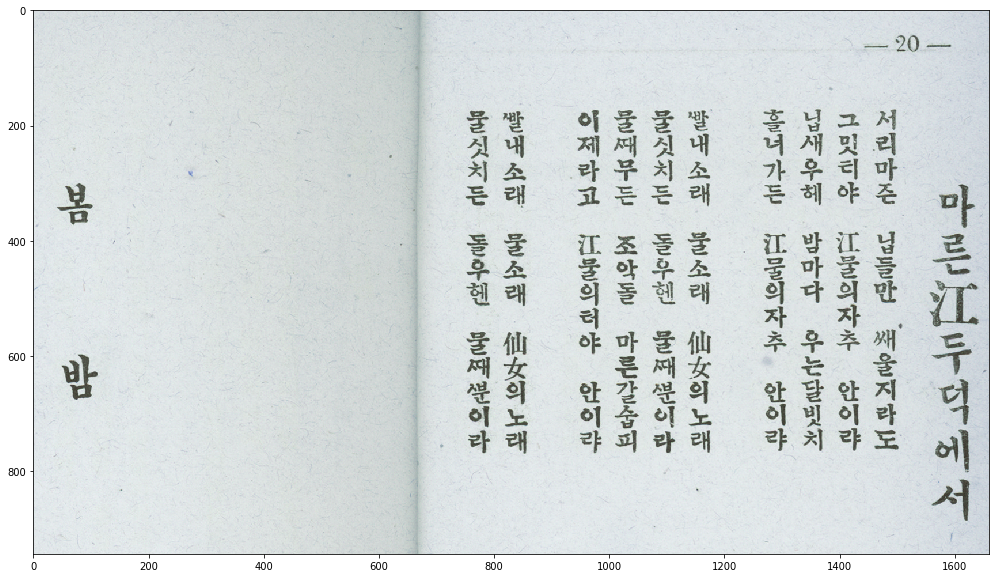

In [3]:
targetfilename = '020-021-cropped.png'
tgimg = cv.imread (targetfilename)
size = tgimg.shape[::-1][1:3]
print (size)
dispSize = (size[0]*10/size[1], 10)
plt.figure (figsize=dispSize)
plt.imshow (tgimg)

In [4]:
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

(35, 10)
cv.TM_CCOEFF


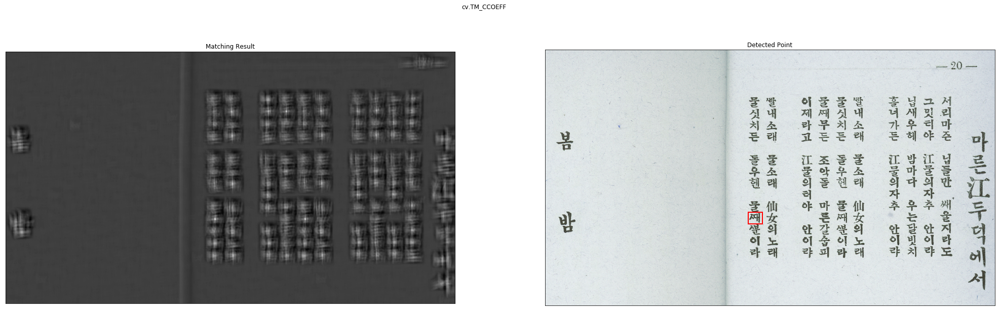

float32
cv.TM_CCOEFF_NORMED


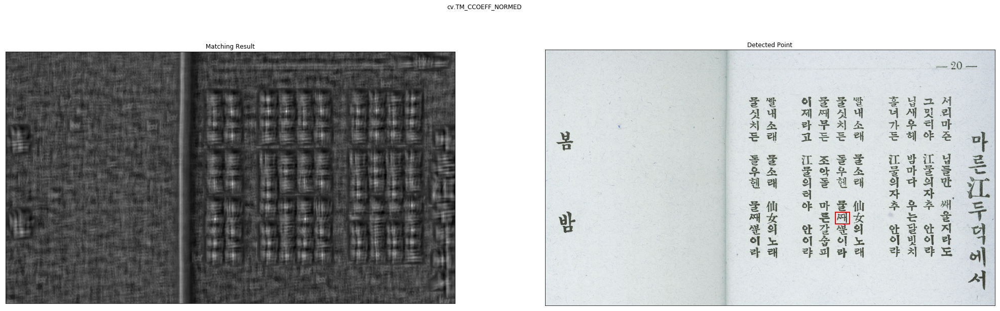

float32
cv.TM_CCORR


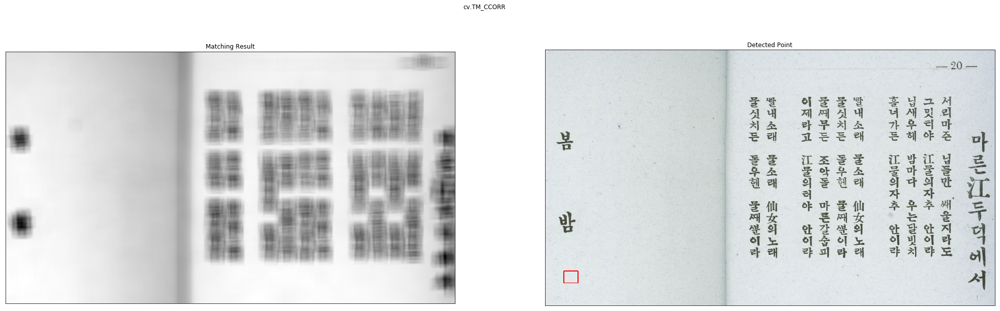

float32
cv.TM_CCORR_NORMED


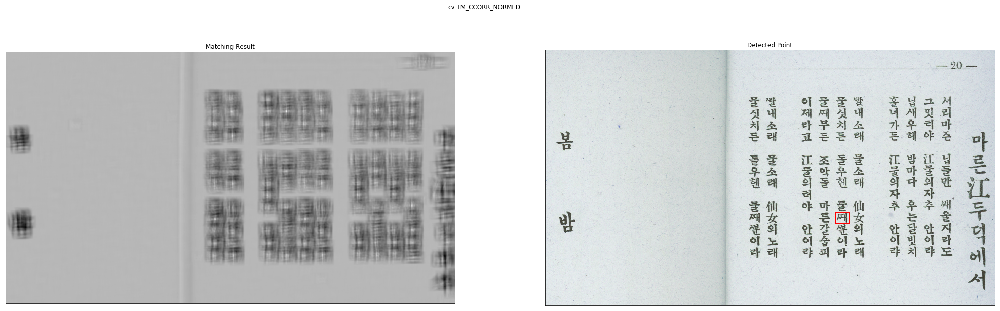

float32
cv.TM_SQDIFF


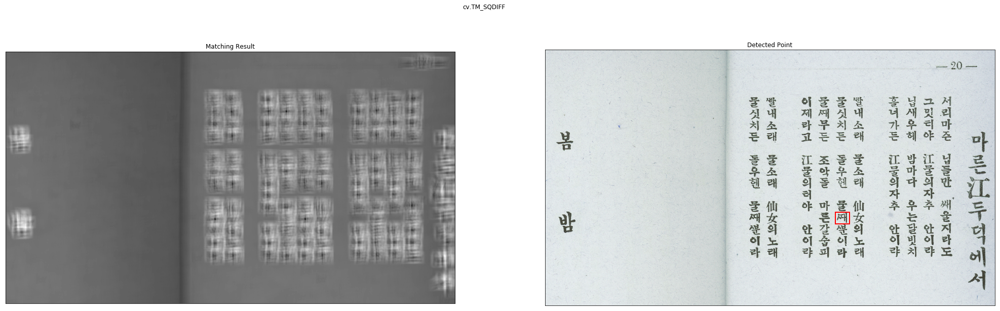

float32
cv.TM_SQDIFF_NORMED


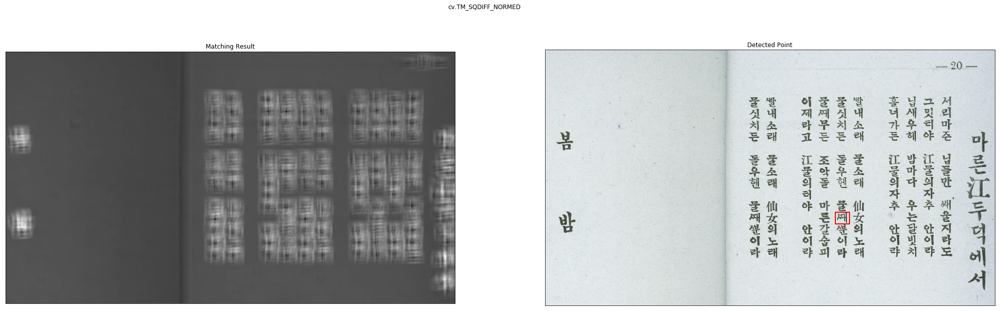

float32


In [5]:
figsize = (int(20*tgimg.shape[1]/tgimg.shape[0]), 10)
print (figsize)
for meth in methods:
    img = tgimg.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv.rectangle(img,top_left, bottom_right, 255, 2)
    
    print (meth)
    plt.figure (figsize=figsize)
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()
    print (res.dtype)

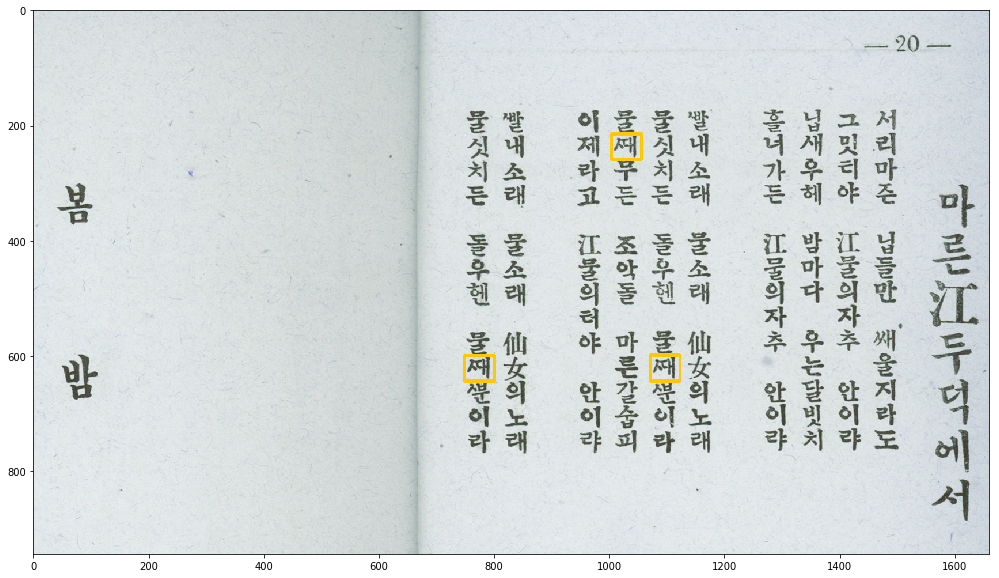

In [6]:
res = cv.matchTemplate(tgimg, template, cv.TM_CCOEFF_NORMED)
disp = tgimg.copy()
threshold = 0.8
locs = np.where(res >= threshold)
for pt in zip(*locs[::-1]):
    cv.rectangle(disp, pt, (pt[0] + w, pt[1] + h), (255,200,5), 2)
#
plt.figure (figsize=dispSize)
plt.imshow (disp)